In [1]:
%load_ext pycodestyle_magic
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import random
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

pd.options.display.max_columns = None

In [2]:
## %%flake8
rfm_3 = pd.read_csv('rfm_3.csv')

## DB Scan

###  Test 1 : Avec les paramètres par défaut

In [3]:
rfm_DBscan_test1 = rfm_3

# Scale des données
scaler = StandardScaler()
rfm_DBscan_test1_scaled = scaler.fit_transform(rfm_DBscan_test1)

In [4]:
# Création du modèle
dbs = DBSCAN()

model = dbs.fit(rfm_DBscan_test1_scaled)

rfm_DBscan_test1['Cluster'] = model.fit_predict(rfm_DBscan_test1_scaled)

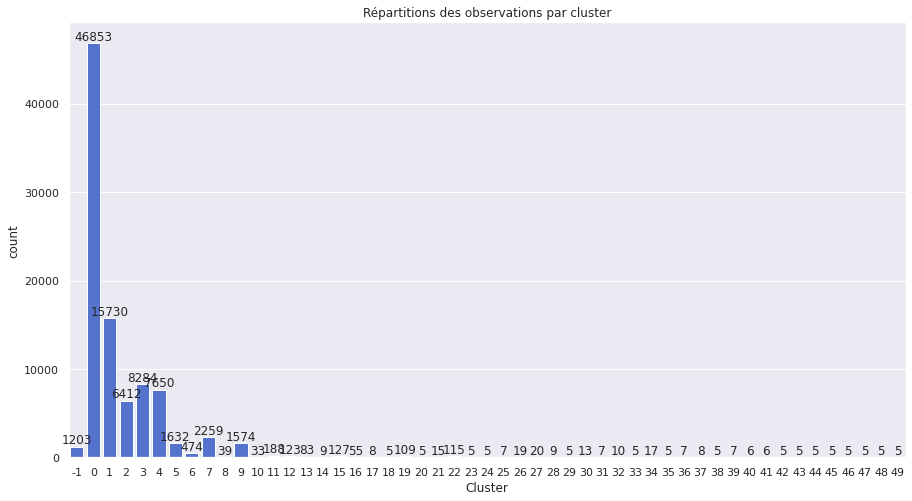

In [5]:
# Visualisation du nombre de clusters
sns.set()
plt.rcParams["figure.figsize"] = (15, 8)
ax = sns.countplot(x='Cluster', data=rfm_DBscan_test1, color='royalblue')
for container in ax.containers:
    ax.bar_label(container)

_ = ax.set_title('Répartitions des observations par cluster')

In [6]:
# Score silhouette
print(f"Le score silhoutte est {round(metrics.silhouette_score(rfm_DBscan_test1_scaled, rfm_DBscan_test1['Cluster']), 3)}")

Le score silhoutte est 0.071


On observe un nombre important de cluster ainsi qu'une très forte disparité entre eux. Nécessité de réduire le nombre de clusters. Un cluster de 500 clients représente env 0.5% de la clientèle totale.

### Test 2 : En ajustant min_samples

In [7]:
rfm_DBscan_test2 = rfm_3
scaler = StandardScaler()
rfm_DBscan_test2_scaled = scaler.fit_transform(rfm_DBscan_test2)

In [8]:
# Création d'un modèle avec 500 individus min
dbs_tuned = DBSCAN(min_samples=500)

model = dbs_tuned.fit(rfm_DBscan_test2_scaled)

rfm_DBscan_test2['Cluster'] = model.fit_predict(rfm_DBscan_test2_scaled)

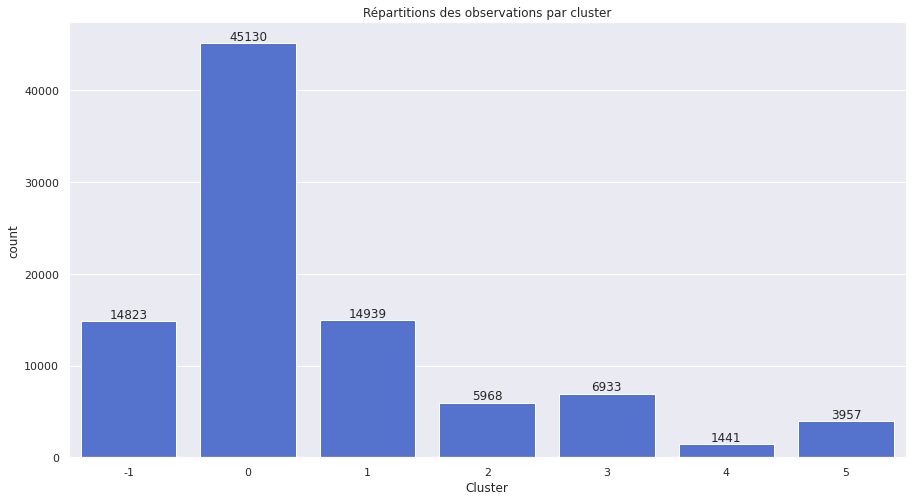

In [9]:
# Visualisation du nombre de cluster
sns.set()
ax = sns.countplot(x='Cluster', data=rfm_DBscan_test2, color='royalblue')
for container in ax.containers:
    ax.bar_label(container)

_ = ax.set_title('Répartitions des observations par cluster')

In [10]:
# Score silhouette
print(f"Le score silhoutte est {round(metrics.silhouette_score(rfm_DBscan_test2_scaled, rfm_DBscan_test2['Cluster']), 3)}")

Le score silhoutte est 0.137


Avec la limite à 500, 6 clusters sont ressortis (comme pour la RFM avec les notes et le nombre de paiement moyen). Néanmoins, le score silhoutte est bien moins élevé.

### Test 3 : Recherche du meilleur Epsilon

In [11]:
rfm_DBscan_test3 = rfm_3
scaler = StandardScaler()
rfm_DBscan_test3_scaled = scaler.fit_transform(rfm_DBscan_test3)

In [12]:
# Création d'un modèle K-neighbors avec 2 pour trouver le meilleur Epsilon
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(rfm_DBscan_test3_scaled)

# Pour chaque point, calcul la distance de ses voisins
distances, indices = nbrs.kneighbors(rfm_DBscan_test3_scaled)

Text(0, 0.5, 'Epsilon')

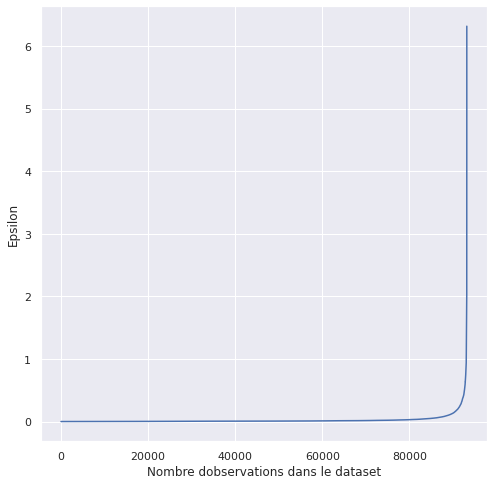

In [13]:
# Trie et affichage des résultats
distances = np.sort(distances, axis=0)
distances = distances[:, 1]

plt.figure(figsize=(8, 8))
plt.plot(distances)
plt.xlabel('Nombre d''observations dans le dataset')
plt.ylabel('Epsilon')

In [14]:
# CRéation du modèle avec 500 ind mini et eps=0,3
dbs_tuned_2 = DBSCAN(min_samples=500, eps=0.3)

model = dbs_tuned_2.fit(rfm_DBscan_test3_scaled)

rfm_DBscan_test3['Cluster'] = model.fit_predict(rfm_DBscan_test3_scaled)

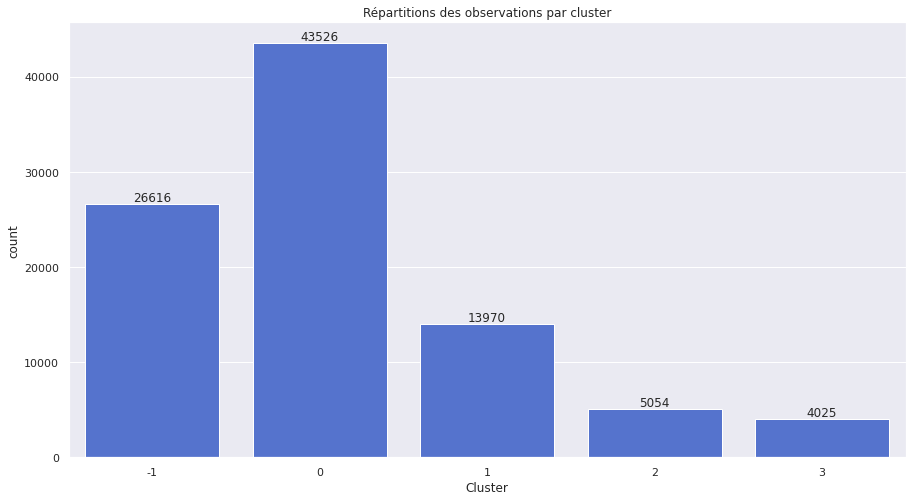

In [15]:
# Visualisation du nombre de clusters
sns.set()
ax = sns.countplot(x='Cluster', data=rfm_DBscan_test3, color='royalblue')
for container in ax.containers:
    ax.bar_label(container)

_ = ax.set_title('Répartitions des observations par cluster')

In [16]:
# Score silhouette
print(f"Le score silhoutte est {round(metrics.silhouette_score(rfm_DBscan_test3_scaled, rfm_DBscan_test3['Cluster']), 3)}")

Le score silhoutte est 0.114


L'alorithme DBScan n'offre pas de bonne performance.

In [17]:
# Création d'un dataframe en inversant StandardScaler pour une meilleure visualisation
rfm_DBscan_test3_scaled_inversed = pd.DataFrame(scaler.inverse_transform(rfm_DBscan_test3_scaled),columns=rfm_DBscan_test3.columns)

rfm_DBscan_test3_scaled_inversed['Cluster'] = rfm_DBscan_test3['Cluster']

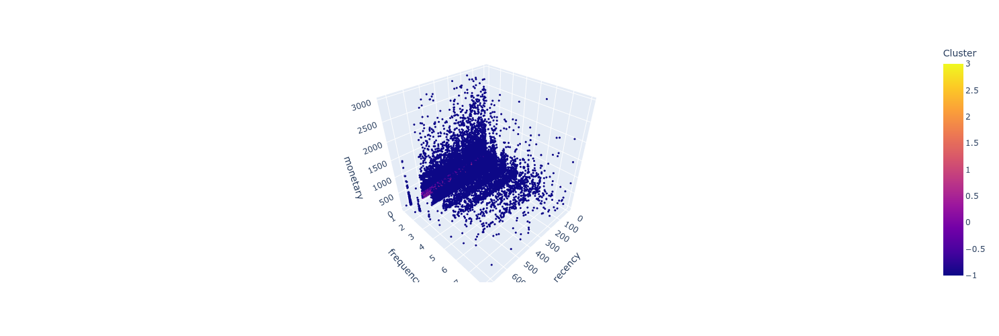

<Figure size 864x360 with 0 Axes>

In [18]:
# Plot 3D
plt.figure(figsize=(12, 5))
fig = px.scatter_3d(rfm_DBscan_test3_scaled_inversed, x='recency',
                    y='frequency',
                    z='monetary',
                    color=rfm_DBscan_test3_scaled_inversed['Cluster'],
                    width=800,
                    height=500)

fig.update_traces(marker_size=1)

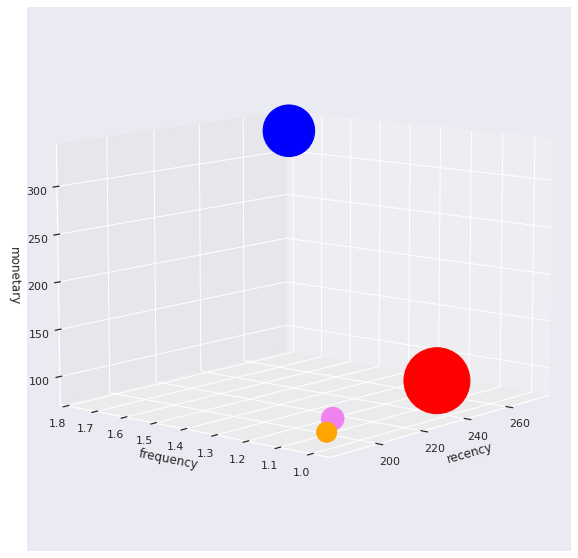

In [19]:
# Graphique avec centroïds pour la présentation
cluster = rfm_DBscan_test3.groupby('Cluster').mean()
cluster_count = rfm_DBscan_test3.groupby('Cluster').count()
cluster_count['somme'] = cluster_count['recency'] + cluster_count['frequency'] + cluster_count['monetary']

colors_4 = ['blue', 'red', 'green', 'violet', 'orange']
sns.set()
plt.figure(figsize=(10, 10))
ax = plt.axes(projection='3d')
ax.scatter3D(cluster['recency'].values, cluster['frequency'].values, cluster['monetary'].values,
             c=colors_4,
             s=cluster_count['somme']/30,
             marker='o',
             alpha=1
             )
ax.set_xlabel('recency')
ax.set_ylabel('frequency')
ax.set_zlabel('monetary')

ax.view_init(10, -140)

## HAC

In [20]:
# Création df pour HAC
rfm_dendo = rfm_3.drop(['Cluster'], axis=1)

In [21]:
rfm_dendo.reset_index()
scaler = StandardScaler()
rfm_dendo_scaled = scaler.fit_transform(rfm_dendo)

In [22]:
Z = linkage(rfm_dendo_scaled)

MemoryError: Unable to allocate 32.4 GiB for an array with shape (4342234645,) and data type float64

Nécessité de réduire le nombre d'observations pour lancer l'algorithme.

In [23]:
rfm_dendo.shape

(93191, 5)

In [24]:
# CRéation d'un nouveau df avec moins d'observations prises aléatoirement
percent_de_la_base = 30
new_index = random.sample(range(rfm_dendo.shape[0]), int(round(rfm_dendo.shape[0]*percent_de_la_base/100, 0)))

In [25]:
rfm_dendo_reduit  = rfm_dendo[rfm_dendo.index.isin(new_index)]
rfm_dendo_reduit.shape

(27957, 5)

In [26]:
scaler = StandardScaler()
rfm_dendo_reduit_scaled = scaler.fit_transform(rfm_dendo_reduit)

In [27]:
Z = linkage(rfm_dendo_reduit_scaled, method='ward')

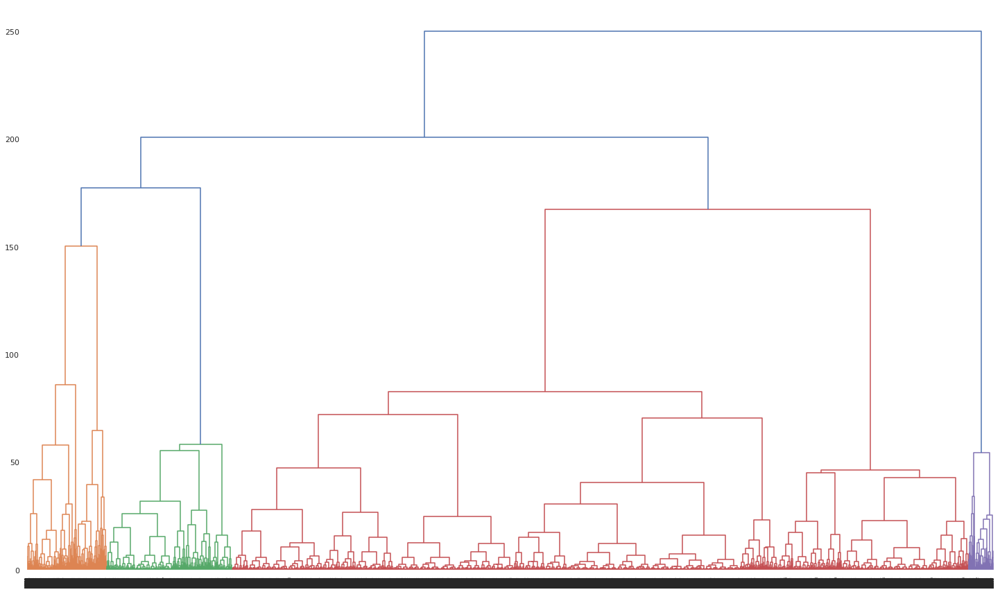

In [28]:
plt.figure(figsize=(25, 15))
dendrogram(Z,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True
          )

plt.show()

In [29]:

cluster = AgglomerativeClustering(n_clusters=5, linkage='ward')
cluster.fit_predict(rfm_dendo_reduit_scaled)

array([4, 2, 3, ..., 2, 2, 4])

In [30]:
# Création d'un dataframe en inversant StandardScaler pour une meilleure visualisation
rfm_dendo_reduit_scaled_inversed = pd.DataFrame(scaler.inverse_transform(rfm_dendo_reduit_scaled), columns=rfm_dendo_reduit.columns)

rfm_dendo_reduit_scaled_inversed['Cluster'] = cluster.labels_

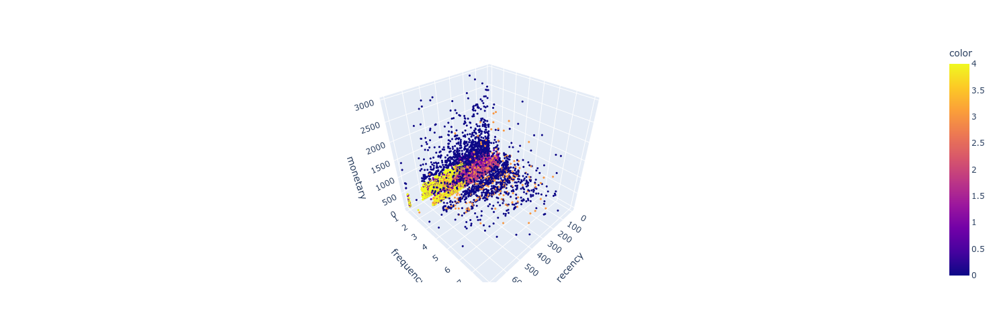

<Figure size 864x360 with 0 Axes>

In [31]:
# Plot 3D
plt.figure(figsize=(12, 5))
fig = px.scatter_3d(rfm_dendo_reduit_scaled_inversed, x='recency',
                    y='frequency',
                    z='monetary',
                    # color = rfm_dendo_reduit_scaled_inversed['Cluster'].apply(lambda x: colors[x]),
                    color=cluster.labels_,
                    width=800,
                    height=500)

fig.update_traces(marker_size=1)